In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

In [2]:
tf.__version__

'2.4.1'

## Loading the Image

In [3]:
img_dog1 = tf.keras.preprocessing.image.load_img('../images/dogs/dog1.jpg')

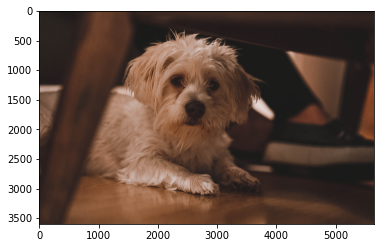

In [4]:
plt.imshow(img_dog1)

## Loading and plotting multiple images

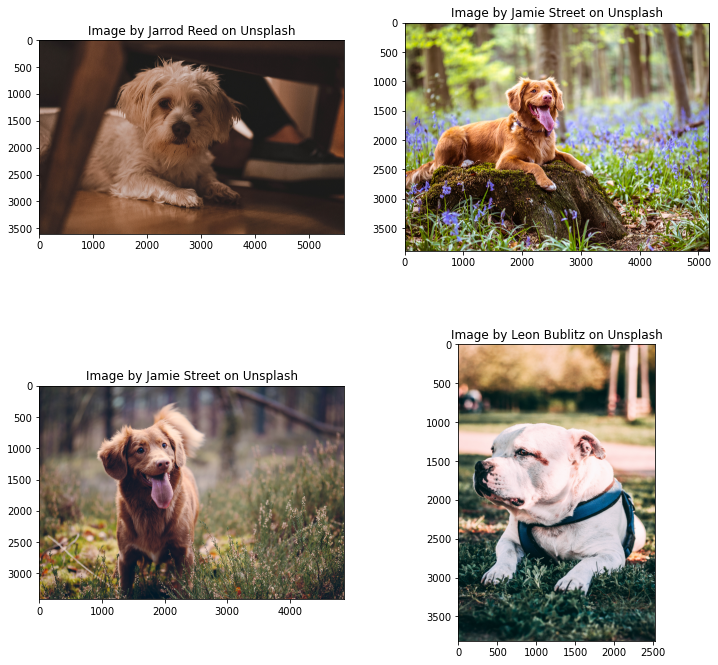

In [5]:
fig = plt.figure(figsize=(12,12))
names = ['Jarrod Reed', 'Jamie Street', 'Jamie Street', 'Leon Bublitz']
for i in range(1,5,1):
    img = tf.keras.preprocessing.image.load_img('../images/dogs/dog'+str(i)+'.jpg')
    ax = fig.add_subplot(2,2,i)
    ax.imshow(img)
    ax.set_title("Image by {0} on Unsplash".format(names[i-1]))

In [6]:
### We can also use the os module to read images
import os
for i in os.listdir('../images/dogs'):
    print(i)

dog4.jpg
dog3.jpg
dog2.jpg
dog1.jpg


## Image to Array and back to Image, Rotation

In [7]:
arr_dog1 = tf.keras.preprocessing.image.img_to_array(img_dog1)

In [8]:
arr_dog1.shape # rows,cols, channels

(3596, 5655, 3)

In [9]:
img_dog1.size

(5655, 3596)

### Rotating the image random_rotation takes a numpy tensor as input so we need to convert the image to array first

In [10]:
rot_dog1 = tf.keras.preprocessing.image.random_rotation(
    arr_dog1, rg=180, row_axis=0, col_axis=1, channel_axis=2, fill_mode='nearest',
    cval=0.0, interpolation_order=1
)

In [11]:
### Now we will have to convert the array back to the image
rot_dog1_img = tf.keras.preprocessing.image.array_to_img(rot_dog1)

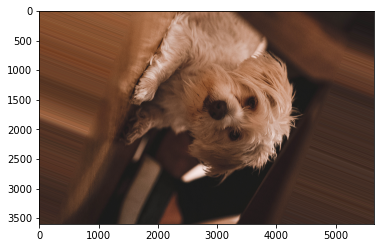

In [12]:
plt.imshow(rot_dog1_img)

## Flip left to right

In [13]:
lr_dog1 = tf.image.flip_left_right(arr_dog1)
lr_img_dog1 = tf.keras.preprocessing.image.array_to_img(lr_dog1)

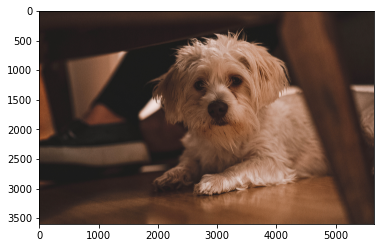

In [14]:
plt.imshow(lr_img_dog1)

In [15]:
### There is also flip_up_down

## Random Zoom

In [16]:
arr_dog1.shape

(3596, 5655, 3)

In [17]:
### zoom less than 1 magnifies the image
rot_dog1 = tf.keras.preprocessing.image.random_zoom(
    arr_dog1, zoom_range=(0.2,0.5), row_axis=0, col_axis=1, channel_axis=2,
    fill_mode='nearest', cval=0.0, interpolation_order=1
)

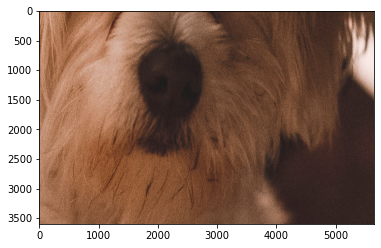

In [19]:
### Converting the array to image and plotting
plt.imshow(tf.keras.preprocessing.image.array_to_img(rot_dog1))

## Resize

In [20]:
img_dog1.size

(5655, 3596)

In [21]:
rsz_dog1 = tf.image.resize(arr_dog1, size = (1200,900))
rsz_dog1.shape

TensorShape([1200, 900, 3])

In [22]:
rsz_img_dog1 = tf.keras.preprocessing.image.array_to_img(rsz_dog1)

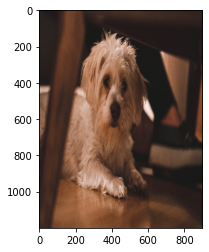

In [23]:
plt.imshow(rsz_img_dog1)

### Since the new size did not have the same aspect ratio, the image is distorted. To avoid this, we can either use the same aspect ratio or use tf.image.resize_with_pad

In [24]:
rsz1_dog1 = tf.image.resize_with_pad(arr_dog1, target_height=1200, target_width=900)
rsz1_dog1.shape

TensorShape([1200, 900, 3])

In [25]:
rsz1_img_dog1 = tf.keras.preprocessing.image.array_to_img(rsz1_dog1)

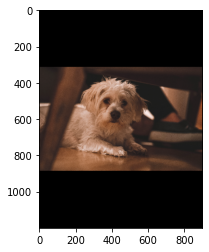

In [26]:
plt.imshow(rsz1_img_dog1)

In [27]:
### The area has been padded with zeroes
#rsz1_dog1

## Crop and Resize
https://www.tensorflow.org/api_docs/python/tf/image/crop_and_resize

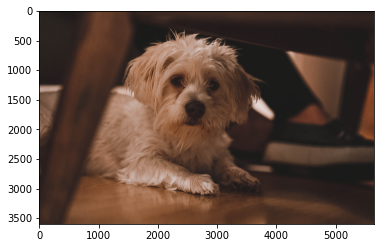

In [28]:
### This is the original image
plt.imshow(img_dog1)

In [29]:
## Before we can use crop_and_resize, we need to make the tensor 4D
arr4d_dog1 = tf.expand_dims(arr_dog1,axis=0)

In [30]:
### 4D (batch, width, height, num_of_channels)
print(arr_dog1.shape, arr4d_dog1.shape)

(3596, 5655, 3) (1, 3596, 5655, 3)


In [31]:
# boxes = [[y1,x1,y2,x2]] and crop_size = [crop_height, crop_width]
crop_rsz_dog1 = tf.image.crop_and_resize(arr4d_dog1, boxes = [[0.12,0.25,0.9,0.65]], 
                                         crop_size = [2600,1800], box_indices=[0])

In [32]:
### Converting the cropped and resized 4d tensor back to 3d
crop_rsz_dog1 = tf.squeeze(crop_rsz_dog1)

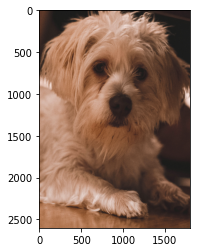

In [33]:
### Converting the array to image and plotting the image
plt.imshow(tf.keras.preprocessing.image.array_to_img(crop_rsz_dog1))

## Generating a random tensorflow array and an Image

In [34]:
tf.constant?

In [35]:
rand_arraynp = np.random.randint(0,300, size = (64,128,3))

In [36]:
rand_arraytf = tf.constant(rand_arraynp)

In [37]:
rand_img = tf.keras.preprocessing.image.array_to_img(rand_arraytf)

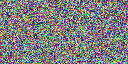

In [38]:
rand_img

## Adjust constrast
https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast

In [39]:
### Look up the link to find how the contrast is calculated
con_dog1 = tf.image.adjust_contrast(arr_dog1, contrast_factor=0.5)

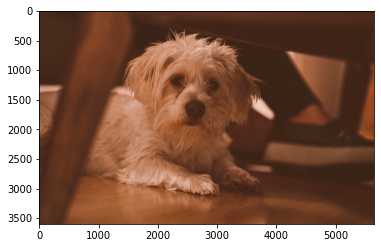

In [40]:
### Converting the array con_dog1 to image and plotting
plt.imshow(tf.keras.preprocessing.image.array_to_img(con_dog1))

## RGB to GrayScale

In [43]:
gry_dog1 = tf.image.rgb_to_grayscale(arr_dog1)

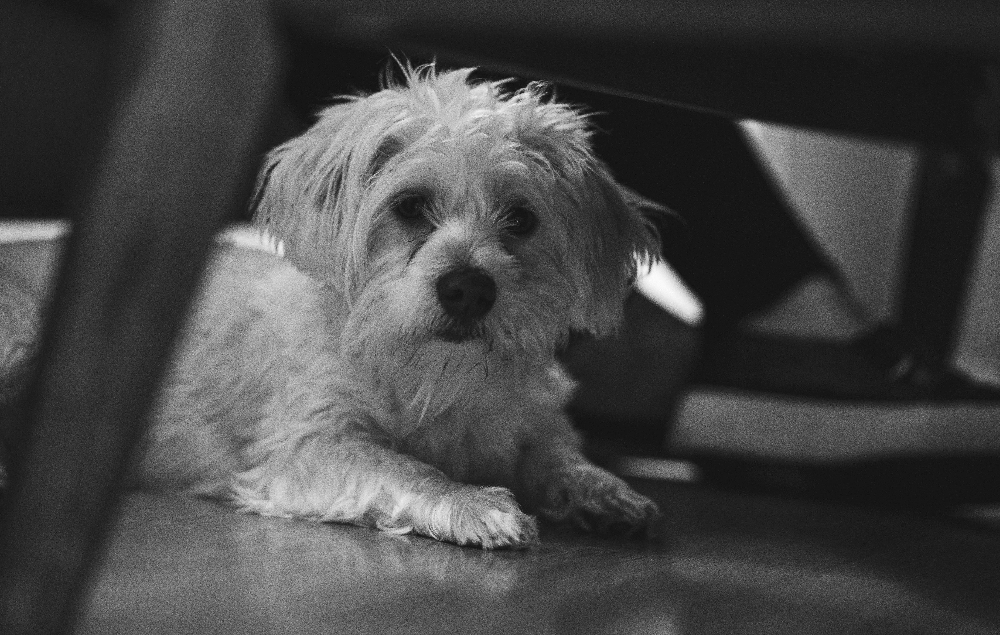

In [45]:
tf.keras.preprocessing.image.array_to_img(gry_dog1)

## Transpose
transposes the height and width dim

In [46]:
trns_dog1 = tf.image.transpose(arr_dog1)

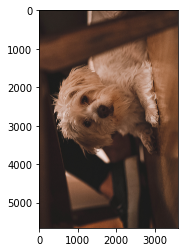

In [47]:
plt.imshow(tf.keras.preprocessing.image.array_to_img(trns_dog1))